<center>
    <h2>CVPR FINAL PROJECT</h2>
    <h3>Section : B</h3>
    <h4>Md. Ishtiyak Ali Rifat ---------> 18-37927-2</h4> 
    <h4>Ehsanul Ahmed --------->   18-37857-2</h4>   
    <h4>Md Abdus Sobhan --------->   18-37855-2</h4>   
    <h4>Atiqullah Habib --------->   19-40022-1</h4>  
    <h3>Dataset Link :<a href="https://www.kaggle.com/gpiosenka/butterfly-images40-species"> https://www.kaggle.com/gpiosenka/butterfly-images40-species</h3>  
          
</center>

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import LearningRateScheduler, ReduceLROnPlateau

import os
import cv2
from os import walk
import glob as gb
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
SEED = 1000
IMG_SIZE = 50
BATCH_SIZE = 128

TRAIN_DIR = 'F:/AIUB/CPVR/dataset/butterfly/butterflies/train'
VALID_DIR = 'F:/AIUB/CPVR/dataset/butterfly/butterflies/valid'
TEST_DIR = 'F:/AIUB/CPVR/dataset/butterfly/butterflies/test'

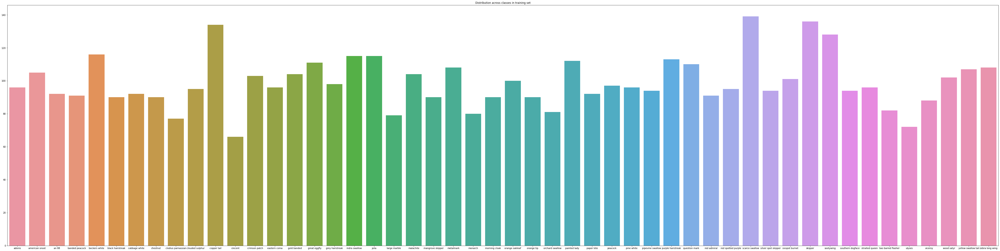

Total Train Examples = 4955


In [3]:
class_names = []
class_count = []
TRAIN_EXAMPLES = 0
for folder in  os.listdir(TRAIN_DIR) : 
    files = gb.glob(pathname= str( TRAIN_DIR + '//' + folder + '/*.jpg'))
    class_names.append(folder)
    class_count.append(len(files))
    TRAIN_EXAMPLES += len(files)
plt.figure(figsize=(80,20))    
sns.barplot(x = class_names, y=class_count).set_title("Distribution across classes in training set")
plt.show()

print(f'Total Train Examples = {TRAIN_EXAMPLES}')

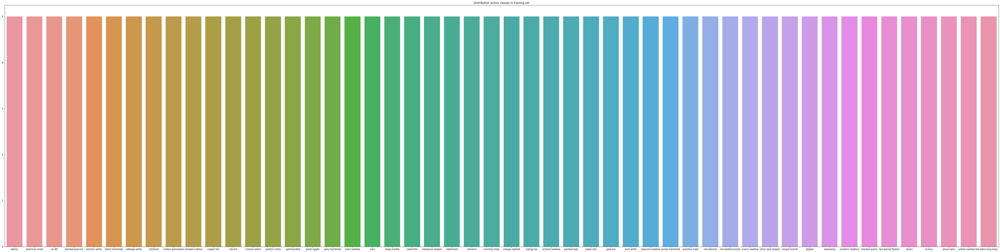

Total Train Examples = 250


In [4]:
class_names = []
class_count = []
VALIDATION_EXAMPLES = 0
for folder in  os.listdir(VALID_DIR) : 
    files = gb.glob(pathname= str( VALID_DIR + '//' + folder + '/*.jpg'))
    class_names.append(folder)
    class_count.append(len(files))
    VALIDATION_EXAMPLES += len(files)
    
plt.figure(figsize=(80,20)) 
sns.barplot(x = class_names, y=class_count).set_title("Distribution across classes in training set")
plt.show()

print(f'Total Train Examples = {VALIDATION_EXAMPLES}')

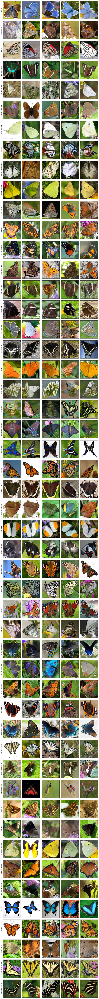

In [5]:
plt.figure(figsize=(10,100))
i=0
for c in os.listdir(TRAIN_DIR):  
    path = os.path.join(TRAIN_DIR,c)
    for img in os.listdir(path):
        img_array = cv2.cvtColor(cv2.imread(os.path.join(path,img)), cv2.COLOR_BGR2RGB) 
        plt.subplot(50,5,i+1)
        plt.imshow(img_array)
        if i%5 == 0:
            plt.ylabel(c)
        plt.xticks([])
        plt.yticks([])
        i += 1
        if i%5 == 0:
            break

plt.tight_layout()        
plt.show() 

In [6]:
train_gen = ImageDataGenerator(
    featurewise_center=False,
    samplewise_center=False,
    featurewise_std_normalization=False,
    samplewise_std_normalization=False,
    zca_whitening=False,
    zca_epsilon=1e-06,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.3,
    channel_shift_range=0.,
    fill_mode='nearest',
    cval=0.,
    horizontal_flip=True,
    vertical_flip=False,
    rescale=None,
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input,
    data_format=None,
    validation_split=0.0,
    dtype=tf.float32,
)

test_gen = ImageDataGenerator(
    preprocessing_function= tf.keras.applications.resnet50.preprocess_input, 
    dtype=tf.float32
)

In [7]:
train_batch = train_gen.flow_from_directory(
    directory = TRAIN_DIR,
    target_size = (IMG_SIZE,IMG_SIZE),
    batch_size = BATCH_SIZE,
    class_mode = 'sparse',
    seed = SEED
)

Found 4955 images belonging to 50 classes.


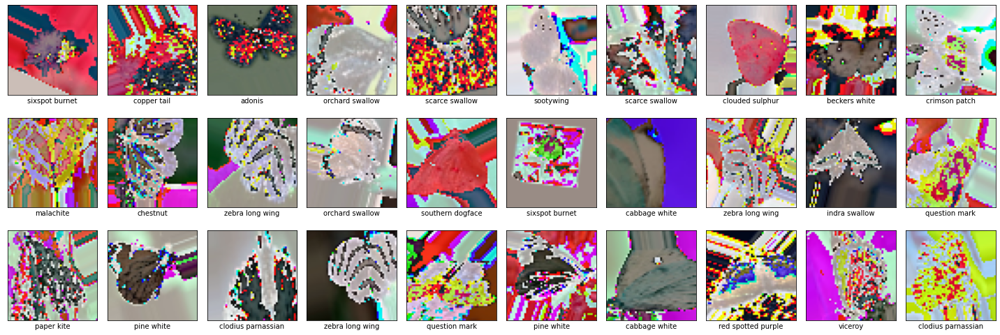

In [8]:
imgs, labels = next(train_batch)
i = 0
plt.figure(figsize=(20,7))
for img, label in zip(imgs, labels):
    plt.subplot(3,10,i+1)
    plt.imshow(img.astype('uint8'))
    plt.xticks([])
    plt.yticks([])
    plt.xlabel(class_names[label.astype('int32')])
    i+=1
    if i == 30:
        break
plt.tight_layout()
plt.show()

In [9]:
valid_batch = train_gen.flow_from_directory(
    directory = VALID_DIR,
    target_size = (IMG_SIZE,IMG_SIZE),
    batch_size = BATCH_SIZE,
    class_mode = 'sparse',
    seed = SEED
)

Found 250 images belonging to 50 classes.


In [11]:
test_batch = test_gen.flow_from_directory(
    directory = TEST_DIR,
    target_size = (IMG_SIZE,IMG_SIZE),
    batch_size = BATCH_SIZE,
    class_mode = None,
    seed = SEED
)

Found 250 images belonging to 50 classes.


In [12]:
def identity_block(X, filters):
    f1, f2, f3 = filters
    X_copy = X
    

    X = layers.Conv2D(filters=f1, kernel_size=(1,1), strides=(1,1), padding='valid')(X)
    X = layers.BatchNormalization(axis=3)(X)
    X = layers.Activation('relu')(X)
    
    X = layers.Conv2D(filters=f2, kernel_size=(3,3), strides=(1,1), padding='same')(X)
    X = layers.BatchNormalization(axis=3)(X)
    X = layers.Activation('relu')(X) 
    
    X = layers.Conv2D(filters=f3, kernel_size=(1,1), strides=(1,1), padding='valid')(X)
    X = layers.BatchNormalization(axis=3)(X)
    
    X = layers.Add()([X, X_copy])
    X = layers.Activation('relu')(X)
    
    return X

In [13]:
def conv_blocks(X, filters, s=2):
    f1, f2, f3 = filters
    X_copy = X
    
    X = layers.Conv2D(filters=f1, kernel_size=(1,1), strides=(s,s), padding='valid')(X)
    X = layers.BatchNormalization(axis=3)(X)
    X = layers.Activation('relu')(X)
    
    X = layers.Conv2D(filters=f2, kernel_size=(3,3), strides=(1,1), padding='same')(X)
    X = layers.BatchNormalization(axis=3)(X)
    X = layers.Activation('relu')(X) 
    
    X = layers.Conv2D(filters=f3, kernel_size=(1,1), strides=(1,1), padding='valid')(X)
    X = layers.BatchNormalization(axis=3)(X)
    
    X_copy = layers.Conv2D(filters=f3, kernel_size=(1,1), strides=(s,s), padding='valid')(X_copy)
    X_copy = layers.BatchNormalization(axis=3)(X_copy)
    
    X = layers.Add()([X, X_copy])
    X = layers.Activation('relu')(X)
    
    return X

<center>
    <h2>Resnet50</h2>
</center>

In [14]:
def ResNet50():
    X_input = keras.Input((IMG_SIZE, IMG_SIZE, 3))
    X = layers.ZeroPadding2D((3,3))(X_input)
    
    X = layers.Conv2D(64, (7,7), strides=(2,2))(X)
    X = layers.BatchNormalization(axis=3)(X)
    X = layers.Activation('relu')(X) 
    X = layers.MaxPooling2D((3,3), strides=(2,2))(X)
    
    X = conv_blocks(X, filters=[64,64,256], s=1)
    X = identity_block(X, filters=[64,64,256])
    X = identity_block(X, filters=[64,64,256])
    
    X = conv_blocks(X, filters=[128,128,512], s=2)
    X = identity_block(X, filters=[128,128,512])
    X = identity_block(X, filters=[128,128,512])
    X = identity_block(X, filters=[128,128,512])
    
    X = conv_blocks(X, filters=[256,256,1024], s=2)
    X = identity_block(X, filters=[256,256,1024])
    X = identity_block(X, filters=[256,256,1024])
    X = identity_block(X, filters=[256,256,1024])
    X = identity_block(X, filters=[256,256,1024])
    X = identity_block(X, filters=[256,256,1024])
    
    X = conv_blocks(X, filters=[512,512,2048], s=2)
    X = identity_block(X, filters=[512,512,2048])
    X = identity_block(X, filters=[512,512,2048])
    
    X = layers.AveragePooling2D((2,2))(X)
    X = layers.Flatten()(X)
    X = layers.Dense(50, activation='softmax', kernel_initializer='he_normal')(X)
    
    model = keras.Model(inputs=X_input, outputs=X, name='ResNet50')
    
    return model

In [15]:
model = ResNet50()
model.summary()

Model: "ResNet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 50, 50, 3)]  0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 56, 56, 3)    0           input_1[0][0]                    
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 25, 25, 64)   9472        zero_padding2d[0][0]             
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 25, 25, 64)   256         conv2d[0][0]                     
___________________________________________________________________________________________

In [16]:
def lr_schedule(epoch):
    lr = 1e-3
    if epoch > 40:
        lr *= 0.5e-3
    elif epoch > 30:
        lr *= 1e-3
    elif epoch > 20:
        lr *= 1e-2
    elif epoch > 10:
        lr *= 1e-1
    print('Learning rate: ', lr)
    return lr
lr_scheduler = LearningRateScheduler(lr_schedule)

In [17]:
model.compile(
    optimizer=keras.optimizers.Adam(lr=lr_schedule(0)), 
    loss='sparse_categorical_crossentropy', 
    metrics=['accuracy']
)

Learning rate:  0.001


c:\anaconda\envs\final-term\lib\site-packages\keras\optimizer_v2\optimizer_v2.py:355: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  warnings.warn(


In [18]:
h = model.fit(train_batch, 
              epochs=50,
              steps_per_epoch = TRAIN_EXAMPLES // BATCH_SIZE,
              validation_data = valid_batch,
              validation_steps = VALIDATION_EXAMPLES // BATCH_SIZE,
              callbacks=lr_scheduler,
              verbose=2
             )

Epoch 1/50
Learning rate:  0.001
38/38 - 39s - loss: 4.6093 - accuracy: 0.0541 - val_loss: 4.9190 - val_accuracy: 0.0156
Epoch 2/50
Learning rate:  0.001
38/38 - 10s - loss: 3.2819 - accuracy: 0.1711 - val_loss: 3.4856 - val_accuracy: 0.0859
Epoch 3/50
Learning rate:  0.001
38/38 - 11s - loss: 2.7689 - accuracy: 0.2654 - val_loss: 3.4673 - val_accuracy: 0.0625
Epoch 4/50
Learning rate:  0.001
38/38 - 11s - loss: 3.2792 - accuracy: 0.2540 - val_loss: 4.6508 - val_accuracy: 0.0547
Epoch 5/50
Learning rate:  0.001
38/38 - 12s - loss: 2.9358 - accuracy: 0.2869 - val_loss: 495.2403 - val_accuracy: 0.0781
Epoch 6/50
Learning rate:  0.001
38/38 - 13s - loss: 2.6674 - accuracy: 0.3269 - val_loss: 20.5024 - val_accuracy: 0.1719
Epoch 7/50
Learning rate:  0.001
38/38 - 13s - loss: 2.2120 - accuracy: 0.3940 - val_loss: 2.3732 - val_accuracy: 0.3125
Epoch 8/50
Learning rate:  0.001
38/38 - 14s - loss: 2.4966 - accuracy: 0.3731 - val_loss: 901.0046 - val_accuracy: 0.1953
Epoch 9/50
Learning rate:  

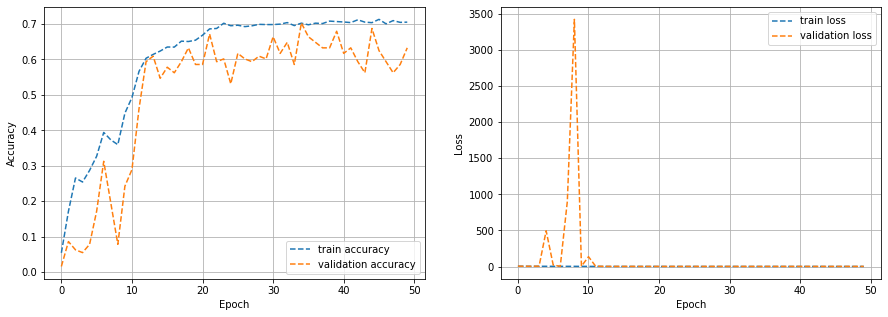

In [19]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(h.history['accuracy'], '--', label='train accuracy')
plt.plot(h.history['val_accuracy'], '--', label = 'validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend(loc='lower right')

plt.subplot(1,2,2)
plt.plot(h.history['loss'], '--', label='train loss')
plt.plot(h.history['val_loss'], '--', label='validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.legend(loc='upper right')

plt.show()

In [20]:
from glob import glob
training_dir=TRAIN_DIR
validation_dir=VALID_DIR
image_files = glob(training_dir + '/*/*')
valid_image_files = glob(validation_dir + '/*/*')

In [21]:
folders = glob(training_dir + '/*')
num_classes = len(folders)
print ('Total Classes = ' + str(num_classes))

Total Classes = 50


<center>
    <h2>Implementation of VGG16</h2>
</center>

In [22]:
from keras.models import Model
from keras.layers import Flatten, Dense
from tensorflow.keras.applications.vgg16 import VGG16

IMG_SIZE=80

IMAGE_SIZE = [IMG_SIZE, IMG_SIZE] 


vgg = VGG16(input_shape = IMAGE_SIZE + [3], weights = 'imagenet', include_top = False) 


for layer in vgg.layers:
    layer.trainable = False

x = Flatten()(vgg.output)

x = Dense(num_classes, activation = 'softmax')(x)  

model_vgg = Model(inputs = vgg.input, outputs = x)

model_vgg.compile(
    loss='sparse_categorical_crossentropy', 
    optimizer='Adam', 
    metrics=['accuracy']
)
model_vgg.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 80, 80, 3)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 80, 80, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 80, 80, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 40, 40, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 40, 40, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 40, 40, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 20, 20, 128)       0     

In [23]:
from keras.applications.vgg16 import preprocess_input

training_datagen = ImageDataGenerator(
                                    rescale=1./255,
                                    shear_range=0.2, 
                                    zoom_range=0.2,
                                    horizontal_flip=False,
                                    preprocessing_function=preprocess_input)

validation_datagen = ImageDataGenerator(rescale = 1./255, preprocessing_function=preprocess_input)

training_generator = training_datagen.flow_from_directory(
    training_dir, 
    target_size = IMAGE_SIZE, 
    batch_size = BATCH_SIZE, 
    class_mode = 'sparse')

validation_generator = validation_datagen.flow_from_directory(
    validation_dir, 
    target_size = IMAGE_SIZE, 
    batch_size = BATCH_SIZE, 
    class_mode = 'sparse')

Found 4955 images belonging to 50 classes.
Found 250 images belonging to 50 classes.


In [24]:
training_images = 4955// BATCH_SIZE
validation_images = 250

history = model_vgg.fit(training_generator,
                   steps_per_epoch = training_images,
                   epochs = 50,
                   validation_data = validation_generator,
                   )

Epoch 1/50
38/38 [==============================] - 118s 2s/step - loss: 3.0896 - accuracy: 0.2805 - val_loss: 2.1879 - val_accuracy: 0.5280
Epoch 2/50
38/38 [==============================] - 20s 513ms/step - loss: 1.8387 - accuracy: 0.6298 - val_loss: 1.5453 - val_accuracy: 0.6360
Epoch 3/50
38/38 [==============================] - 29s 767ms/step - loss: 1.3767 - accuracy: 0.7085 - val_loss: 1.2399 - val_accuracy: 0.7320
Epoch 4/50
38/38 [==============================] - 38s 977ms/step - loss: 1.1354 - accuracy: 0.7572 - val_loss: 1.0977 - val_accuracy: 0.7400
Epoch 5/50
38/38 [==============================] - 45s 1s/step - loss: 0.9806 - accuracy: 0.7837 - val_loss: 0.9871 - val_accuracy: 0.7680
Epoch 6/50
38/38 [==============================] - 55s 1s/step - loss: 0.8678 - accuracy: 0.8100 - val_loss: 0.9098 - val_accuracy: 0.7800
Epoch 7/50
38/38 [==============================] - 64s 2s/step - loss: 0.7906 - accuracy: 0.8310 - val_loss: 0.8465 - val_accuracy: 0.7960
Epoch 8/50

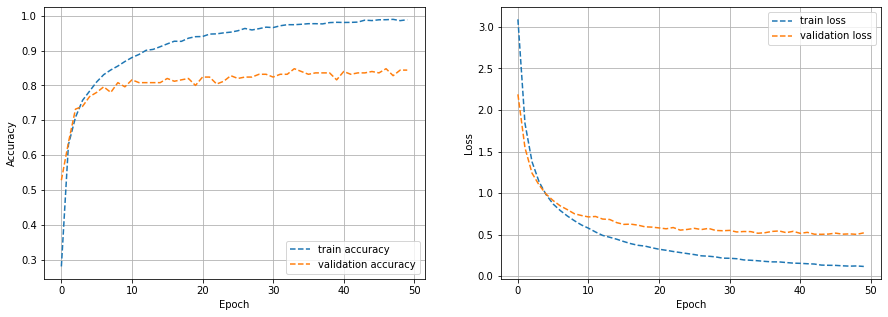

In [26]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], '--', label='train accuracy')
plt.plot(history.history['val_accuracy'], '--', label = 'validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend(loc='lower right')

plt.subplot(1,2,2)
plt.plot(history.history['loss'], '--', label='train loss')
plt.plot(history.history['val_loss'], '--', label='validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.legend(loc='upper right')

plt.show()

<center>
    <h2>Single Layer Visualization of VGG16</h2>
</center>

In [33]:
img_path = 'F:/AIUB/CPVR/dataset/butterfly/butterflies/train/peacock/65.jpg'

from keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(50, 50))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

print(img_tensor.shape)

(1, 50, 50, 3)


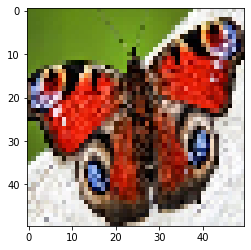

In [34]:
plt.imshow(img_tensor[0])
plt.show()

In [35]:
from keras import models

layer_outputs = [layer.output for layer in model.layers[:16]]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

(1, 50, 50, 3)


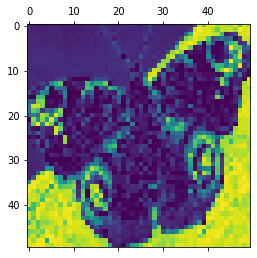

In [37]:
activations = activation_model.predict(img_tensor)
first_layer_activation = activations[0]
print(first_layer_activation.shape)
plt.matshow(first_layer_activation[0, :, :, 2], cmap='viridis')
plt.show()

c:\Temp/ipykernel_10780/2203890663.py:40: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(display_grid, aspect='auto', cmap='gray')
c:\Temp/ipykernel_10780/2203890663.py:27: RuntimeWarning: invalid value encountered in true_divide
  channel_image /= channel_image.std()
c:\anaconda\envs\final-term\lib\site-packages\matplotlib\tight_bbox.py:71: RuntimeWarning: divide by zero encountered in double_scalars
  fig.patch.set_bounds(x0 / w1, y0 / h1,
c:\anaconda\envs\final-term\lib\site-packages\matplotlib\tight_bbox.py:72: RuntimeWarning: divide by zero encountered in double_scalars
  fig.bbox.width / w1, fig.bbox.height / h1)
c:\anaconda\envs\final-term\lib\site-packages\matplotlib\patches.py:769: RuntimeWarning: invalid value encountered in double_scalars
  y1 = self.convert_yunits(self._y0 + self._height)
c:\anaconda\envs\final-term\lib\site-packages\matplotlib\transforms.py:2013: RuntimeWarning: inva

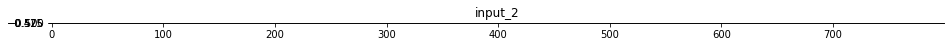

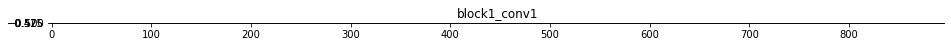

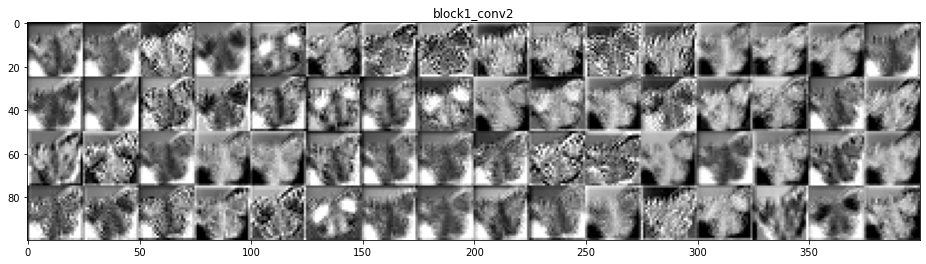

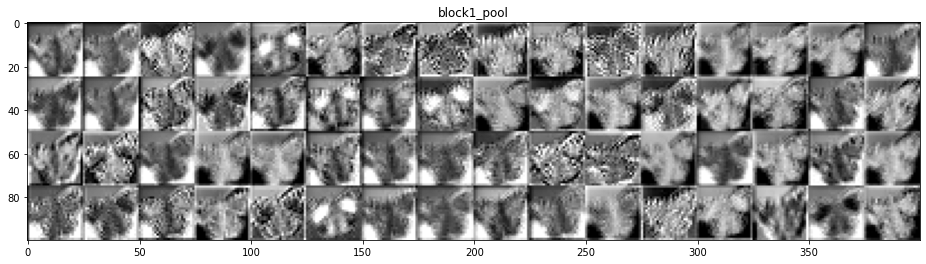

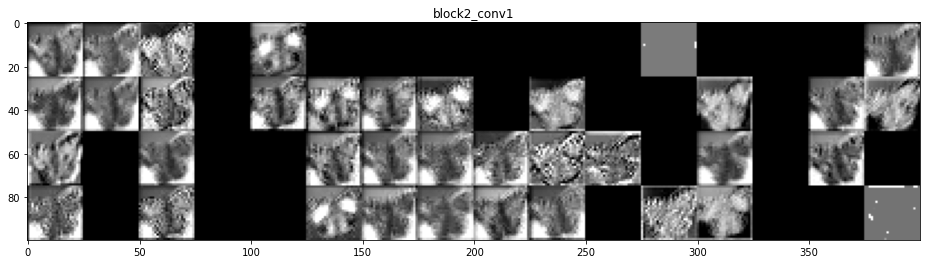

...

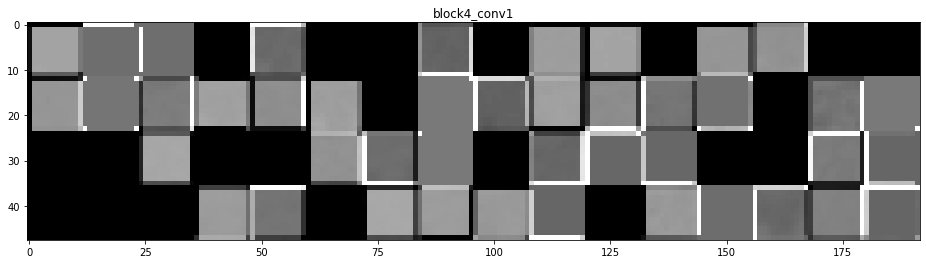

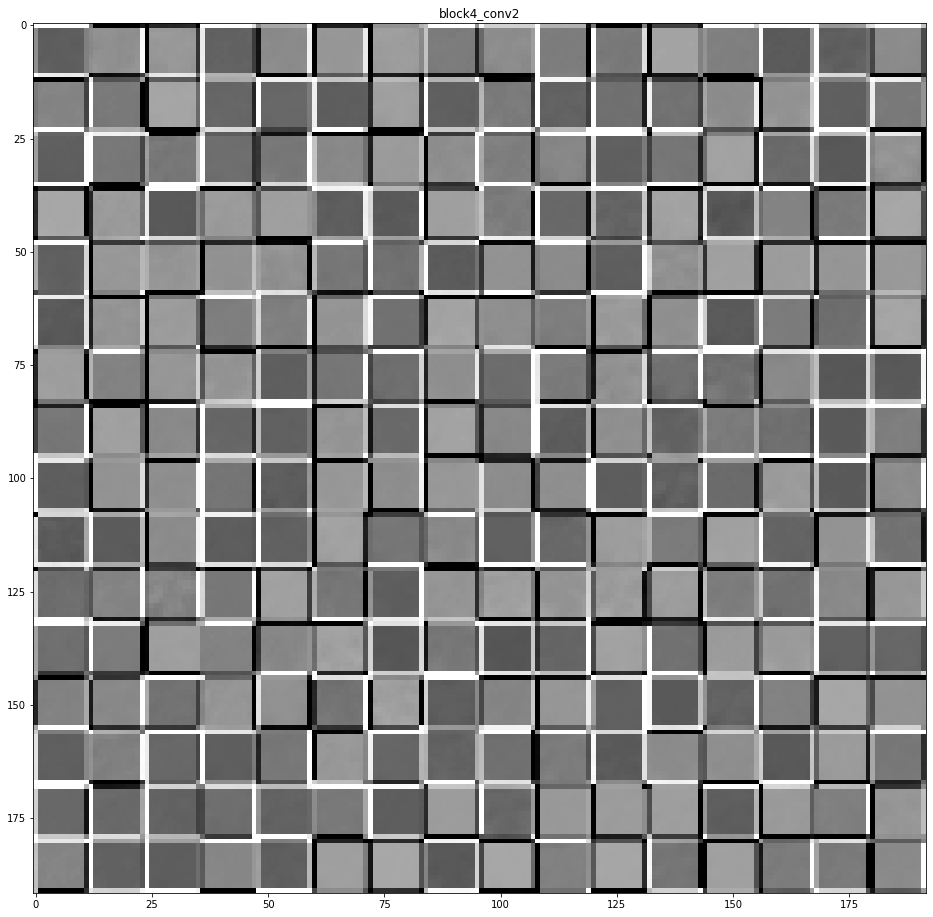

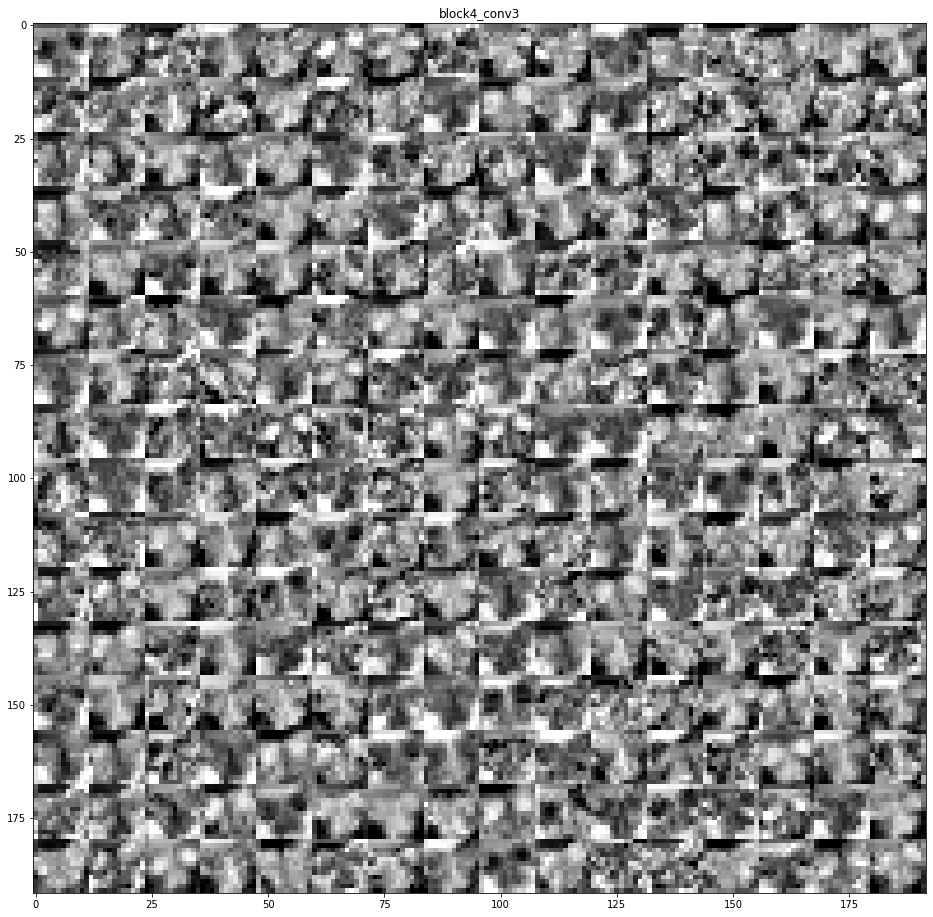

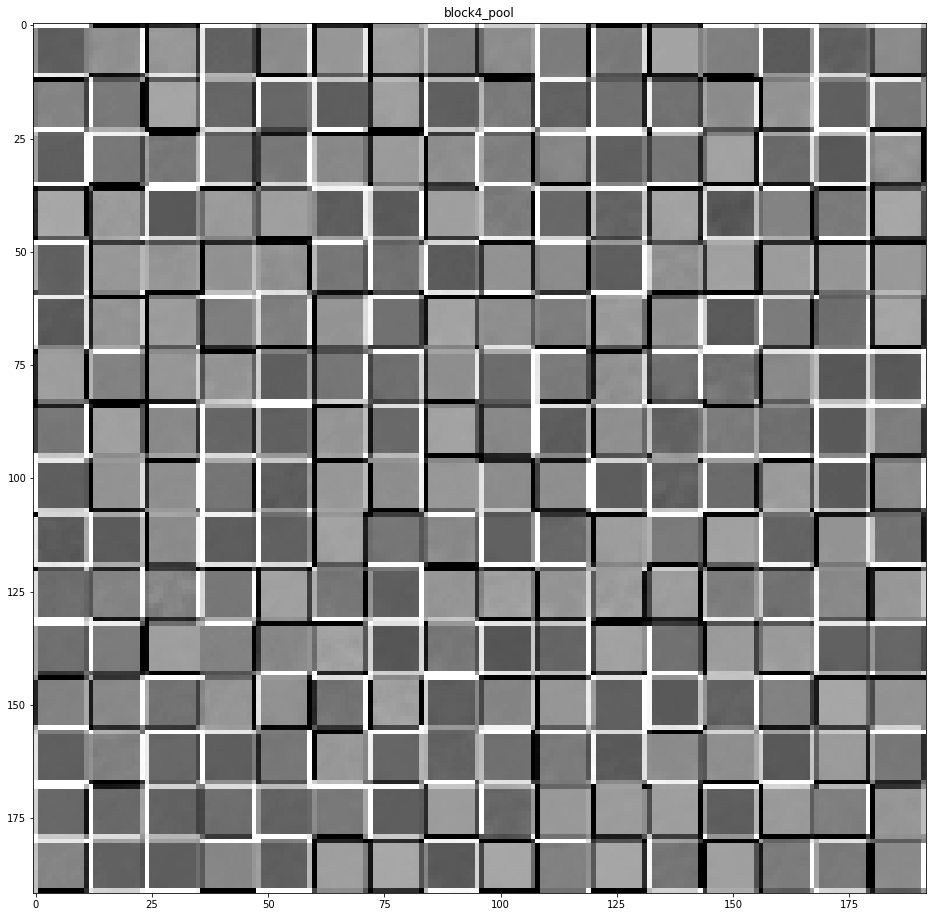

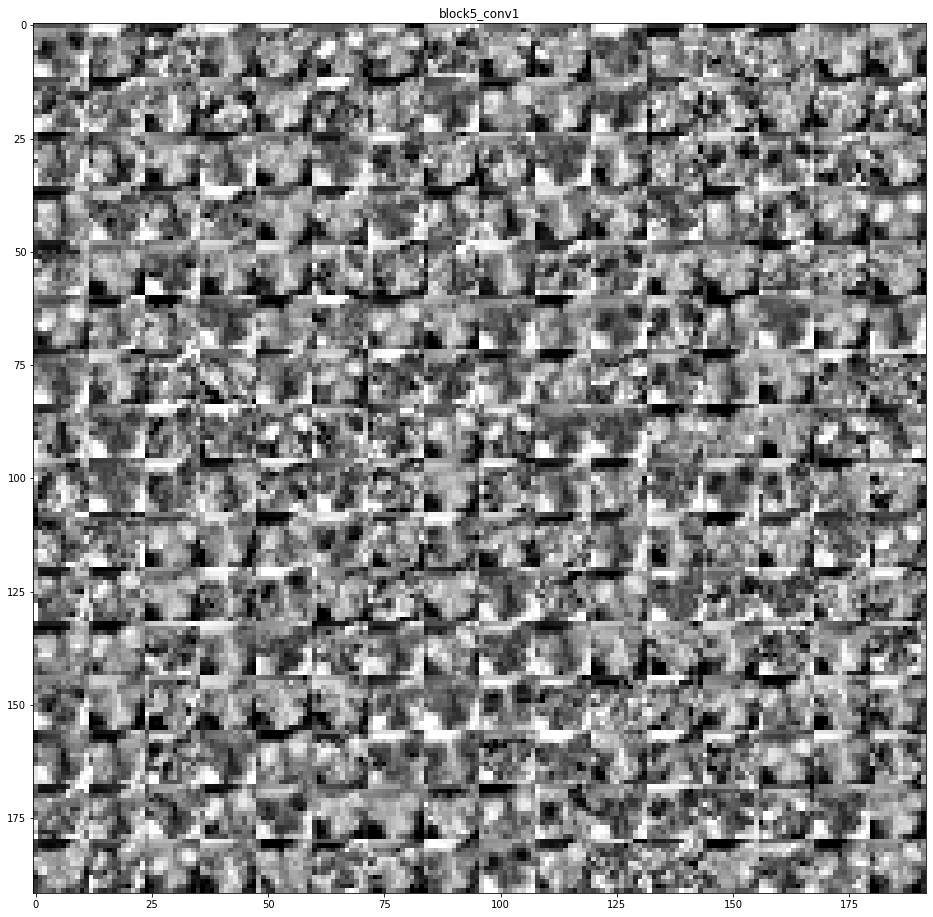

In [38]:
layer_names = []
for layer in model_vgg.layers[:16]:
    layer_names.append(layer.name)

images_per_row = 16


for layer_name, layer_activation in zip(layer_names, activations):

    n_features = layer_activation.shape[-1]


    size = layer_activation.shape[1]


    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))


    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]

            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image


    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='gray')
    
plt.show()

<center>
    <h2>Proposed new CNN Model</h2>
</center>

In [39]:
CATEGORIES = []
for c in os.listdir(TRAIN_DIR):
    CATEGORIES.append(c)
print (CATEGORIES)

['adonis', 'american snoot', 'an 88', 'banded peacock', 'beckers white', 'black hairstreak', 'cabbage white', 'chestnut', 'clodius parnassian', 'clouded sulphur', 'copper tail', 'crecent', 'crimson patch', 'eastern coma', 'gold banded', 'great eggfly', 'grey hairstreak', 'indra swallow', 'julia', 'large marble', 'malachite', 'mangrove skipper', 'metalmark', 'monarch', 'morning cloak', 'orange oakleaf', 'orange tip', 'orchard swallow', 'painted lady', 'paper kite', 'peacock', 'pine white', 'pipevine swallow', 'purple hairstreak', 'question mark', 'red admiral', 'red spotted purple', 'scarce swallow', 'silver spot skipper', 'sixspot burnet', 'skipper', 'sootywing', 'southern dogface', 'straited queen', 'two barred flasher', 'ulyses', 'viceroy', 'wood satyr', 'yellow swallow tail', 'zebra long wing']


In [40]:
from tqdm import tqdm

IMG_SIZE = 64
train_data=[]
for c in CATEGORIES:
    path = os.path.join (TRAIN_DIR,c)
    class_num = CATEGORIES.index(c)
    for img in tqdm(os.listdir (path)):
        try:
            img_arr = cv2.imread(os.path.join(path,img))
            img_resized = cv2.resize (img_arr,(IMG_SIZE, IMG_SIZE))
            train_data.append ([img_resized, class_num])
        except Exception as e:
            pass

print (len(train_data))

100%|███████████████████████████████████████████████████████████████████████████████| 108/108 [00:00<00:00, 955.56it/s]

4955


In [41]:
test_data=[]
for c in CATEGORIES:
    path = os.path.join (TEST_DIR,c)
    class_num = CATEGORIES.index(c)
    for img in tqdm(os.listdir(path)):
        try:
            img_arr = cv2.imread(os.path.join(path,img))
            img_resized = cv2.resize (img_arr,(IMG_SIZE, IMG_SIZE))
            test_data.append ([img_resized, class_num])
        except Exception as e:
            pass

print (len(test_data))

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 161.57it/s]

250


In [42]:
valid_data=[]
for c in CATEGORIES:
    path = os.path.join (VALID_DIR,c)
    class_num = CATEGORIES.index(c)
    for img in tqdm(os.listdir(path)):
        try:
            img_arr = cv2.imread(os.path.join(path,img))
            img_resized = cv2.resize (img_arr,(IMG_SIZE, IMG_SIZE))
            valid_data.append ([img_resized, class_num])
        except Exception as e:
            pass

print (len(valid_data))

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 557.04it/s]

250


In [43]:
import random
random.shuffle (train_data)
random.shuffle (test_data)
random.shuffle (valid_data)

(4955, 64, 64, 3) (4955,)


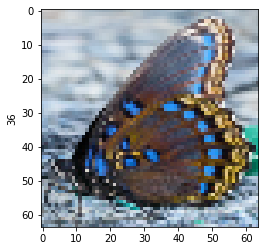

In [44]:
X_train = []
Y_train = []
for img,label in train_data:
    X_train.append (img)
    Y_train.append (label)

X_train = np.array(X_train).astype('float32').reshape (-1,IMG_SIZE,IMG_SIZE,3)
Y_train = np.array (Y_train)

print (X_train.shape, Y_train.shape)
plt.figure()
plt.imshow(X_train[2000].astype('uint8'))
plt.ylabel(Y_train[2000])
plt.show()

In [45]:
X_test = []
Y_test = []
for img,label in test_data:
    X_test.append (img)
    Y_test.append (label)

X_test = np.array(X_test).astype('float32').reshape (-1,IMG_SIZE,IMG_SIZE,3)
Y_test = np.array (Y_test)

print (X_test.shape, Y_test.shape)

(250, 64, 64, 3) (250,)


In [46]:
X_valid = []
Y_valid = []
for img,label in valid_data:
    X_valid.append (img)
    Y_valid.append (label)

X_valid = np.array(X_valid).astype('float32').reshape (-1,IMG_SIZE,IMG_SIZE,3)
Y_valid = np.array (Y_valid)

print (X_valid.shape, Y_valid.shape)

(250, 64, 64, 3) (250,)


In [47]:
mean_rgb = np.mean(X_train, axis=(0,1,2))
print(mean_rgb)

[ 80.52242  116.087036 119.445724]


In [48]:
X_train_norm = np.empty_like(X_train)
X_test_norm = np.empty_like(X_test)
X_valid_norm = np.empty_like(X_valid)

In [49]:
for i in range(len(X_train)):
    for c in range(3):
        if(c==1):
            X_train_norm[i,:, :, c] = X_train[i,:, :, c] - mean_rgb[0]
        elif(c==2):
            X_train_norm[i,:, :, c] = X_train[i,:, :, c] - mean_rgb[1]
        else:
            X_train_norm[i,:, :, c] = X_train[i,:, :, c] - mean_rgb[2]
            
for i in range(len(X_test)):
    for c in range(3):
        if(c==1):
            X_test_norm[i,:, :, c] = X_test[i,:, :, c] - mean_rgb[0]
        elif(c==2):
            X_test_norm[i,:, :, c] = X_test[i,:, :, c] - mean_rgb[1]
        else:
            X_test_norm[i,:, :, c] = X_test[i,:, :, c] - mean_rgb[2]

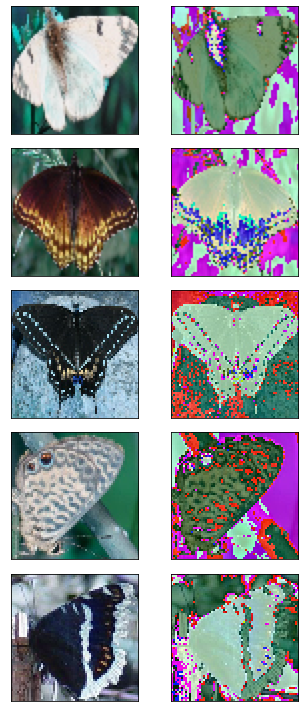

In [50]:
c = 0
plt.figure(figsize=(5,10))
for i in range(5):
    plt.subplot(5,2,c+1)
    plt.imshow(X_train[i].astype('uint8'))
    plt.xticks([])
    plt.yticks([])
    
    plt.subplot(5,2,c+2)
    plt.imshow(X_train_norm[i].astype('uint8'))
    plt.xticks([])
    plt.yticks([])

    c += 2
    
plt.tight_layout()
plt.show()

In [51]:
SPEC_SHAPE = (IMG_SIZE, IMG_SIZE)

model = tf.keras.Sequential([
    
    # First conv block
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(SPEC_SHAPE[0], SPEC_SHAPE[1], 3)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)),
    
    # Second conv block
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)), 
    
    # Third conv block
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)), 
    
    # Fourth conv block
    tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)),
    
    # Global pooling instead of flatten()
    tf.keras.layers.GlobalAveragePooling2D(), 
    
    # Dense block
    #tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(256, activation='relu'),   
    tf.keras.layers.Dropout(0.2),  
    tf.keras.layers.Dense(512, activation='relu'),   
    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Dense(50, activation='softmax')
])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_53 (Conv2D)           (None, 62, 62, 32)        896       
_________________________________________________________________
batch_normalization_53 (Batc (None, 62, 62, 32)        128       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 31, 31, 32)        0         
_________________________________________________________________
conv2d_54 (Conv2D)           (None, 29, 29, 64)        18496     
_________________________________________________________________
batch_normalization_54 (Batc (None, 29, 29, 64)        256       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_55 (Conv2D)           (None, 12, 12, 128)       7

In [52]:
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001), 
    loss='sparse_categorical_crossentropy', 
    metrics=['accuracy']
)

In [53]:
from tensorflow.keras.callbacks import EarlyStopping

#cb = EarlyStopping(monitor='val_loss', min_delta=0.02, patience=3, restore_best_weights=True)

h = model.fit(x=X_train_norm, y=Y_train, 
              epochs=50, 
              validation_data=(X_valid, Y_valid),
              batch_size=BATCH_SIZE,
              verbose=2,
              #callbacks=[cb]
             )

Epoch 1/50
39/39 - 4s - loss: 2.7830 - accuracy: 0.2505 - val_loss: 14.1302 - val_accuracy: 0.0200
Epoch 2/50
39/39 - 2s - loss: 1.8029 - accuracy: 0.4670 - val_loss: 4.0007 - val_accuracy: 0.1280
Epoch 3/50
39/39 - 2s - loss: 1.2734 - accuracy: 0.6170 - val_loss: 2.3965 - val_accuracy: 0.3400
Epoch 4/50
39/39 - 2s - loss: 0.9914 - accuracy: 0.6951 - val_loss: 2.7157 - val_accuracy: 0.2640
Epoch 5/50
39/39 - 2s - loss: 0.7504 - accuracy: 0.7689 - val_loss: 2.0136 - val_accuracy: 0.4160
Epoch 6/50
39/39 - 2s - loss: 0.5646 - accuracy: 0.8222 - val_loss: 2.1791 - val_accuracy: 0.3960
Epoch 7/50
39/39 - 2s - loss: 0.4165 - accuracy: 0.8684 - val_loss: 3.1185 - val_accuracy: 0.2480
Epoch 8/50
39/39 - 2s - loss: 0.3272 - accuracy: 0.8955 - val_loss: 3.0538 - val_accuracy: 0.3000
Epoch 9/50
39/39 - 2s - loss: 0.2718 - accuracy: 0.9068 - val_loss: 3.3678 - val_accuracy: 0.2760
Epoch 10/50
39/39 - 2s - loss: 0.2029 - accuracy: 0.9320 - val_loss: 3.1903 - val_accuracy: 0.3360
Epoch 11/50
39/39 

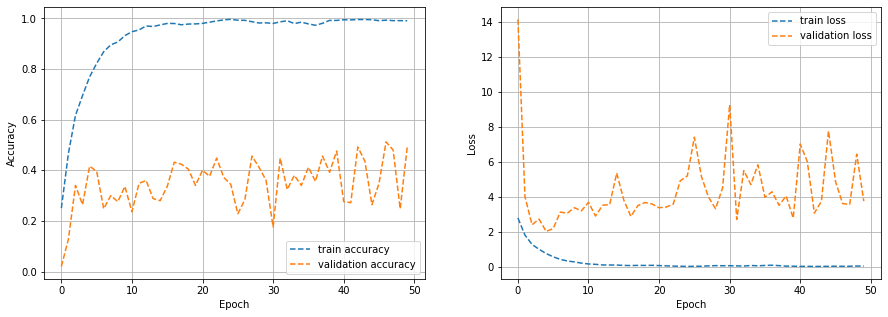

In [54]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(h.history['accuracy'], '--', label='train accuracy')
plt.plot(h.history['val_accuracy'], '--', label = 'validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend(loc='lower right')

plt.subplot(1,2,2)
plt.plot(h.history['loss'], '--', label='train loss')
plt.plot(h.history['val_loss'], '--', label='validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.legend(loc='upper right')

plt.show()

<center>
    <h2>Single Layer Visualization of Proposed CNN Model</h2>
</center>

In [60]:
img_path = 'F:/AIUB/CPVR/dataset/butterfly/butterflies/train/peacock/85.jpg'

from keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(64, 64))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

print(img_tensor.shape)

(1, 64, 64, 3)


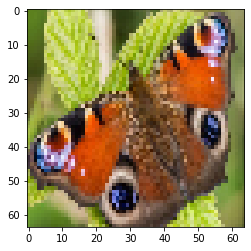

In [61]:
plt.imshow(img_tensor[0])
plt.show()

In [62]:
from keras import models

layer_outputs = [layer.output for layer in model.layers[:8]]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

(1, 62, 62, 32)


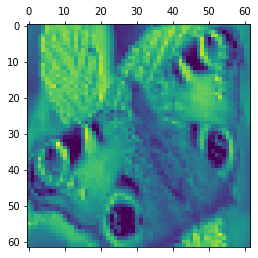

In [63]:
activations = activation_model.predict(img_tensor)
first_layer_activation = activations[0]
print(first_layer_activation.shape)
plt.matshow(first_layer_activation[0, :, :, 2], cmap='viridis')
plt.show()

c:\Temp/ipykernel_10780/2203890663.py:27: RuntimeWarning: invalid value encountered in true_divide
  channel_image /= channel_image.std()
c:\Temp/ipykernel_10780/2203890663.py:27: RuntimeWarning: divide by zero encountered in true_divide
  channel_image /= channel_image.std()


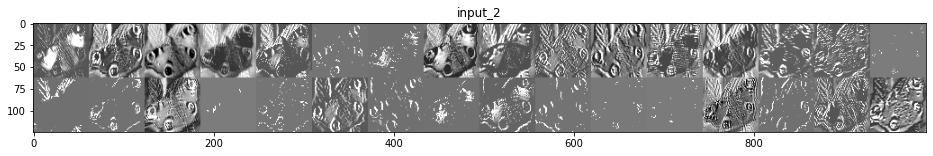

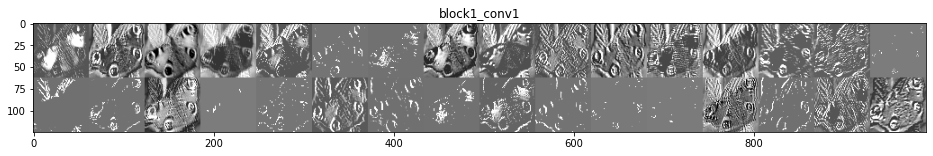

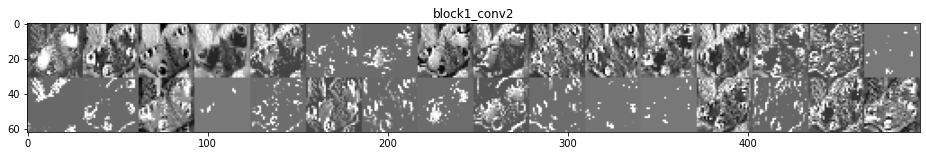

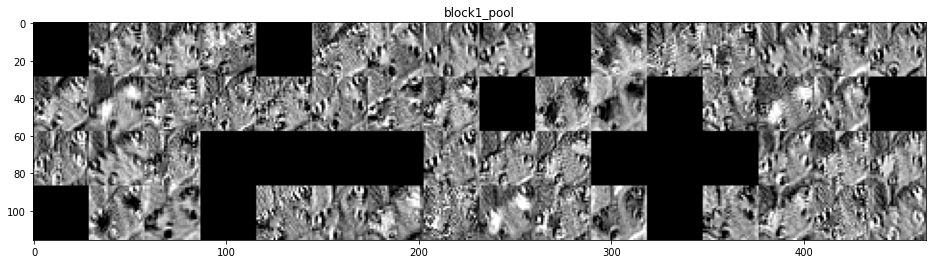

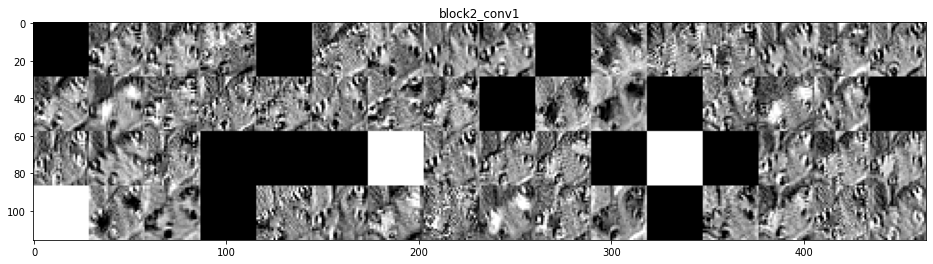

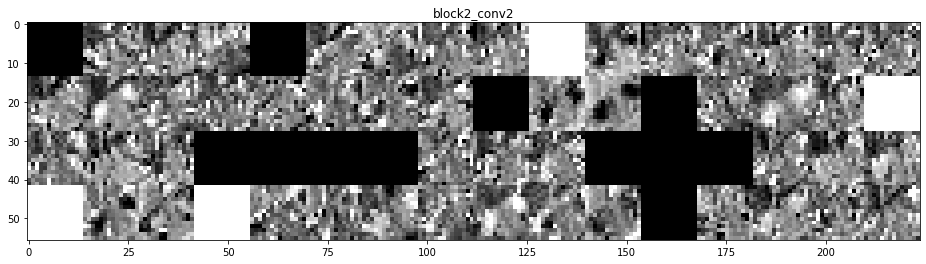

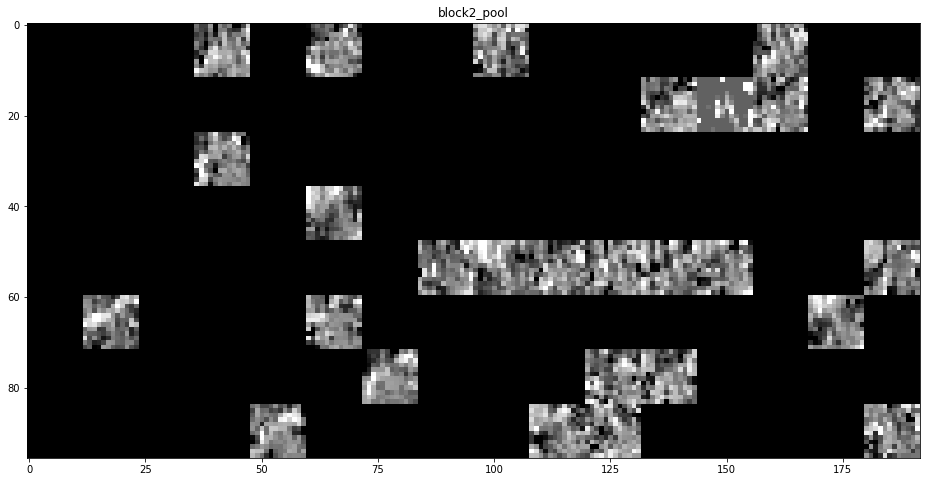

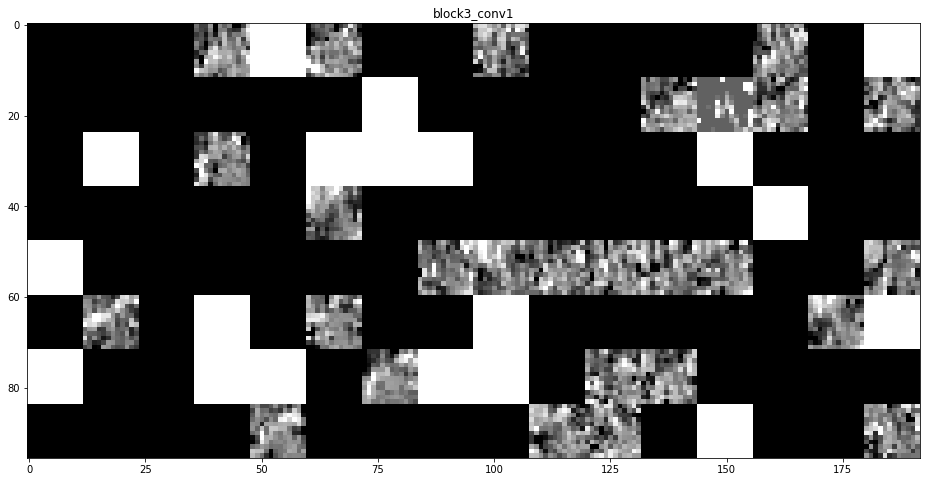

In [64]:
layer_names = []
for layer in model_vgg.layers[:16]:
    layer_names.append(layer.name)

images_per_row = 16


for layer_name, layer_activation in zip(layer_names, activations):

    n_features = layer_activation.shape[-1]


    size = layer_activation.shape[1]


    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))


    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]

            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image


    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='gray')
    
plt.show()